# Import required libraries and define the required functions

In [28]:
import cv2 as cv
import numpy as np
import urllib.request
from matplotlib import pyplot as plt
from numba import jit
from ultralytics import YOLO
from scipy import stats
from sklearn.cluster import KMeans

# import Models
# model = YOLO('./models/yolov8n-seg.pt')
# model = YOLO('./models/yolov8x-seg.pt')
# model = YOLO('./models/yolov8s-seg.pt')
# model = YOLO('./models/yolov8m-seg.pt')
model = YOLO('./models/yolov9c-seg.pt')
# model = YOLO('./models/yolov9e-seg.pt')
# model = YOLO('./models/yolo11n-seg.pt')
# model = YOLO('./models/yolo11x-seg.pt')
# model = YOLO('./models/yolo11s-seg.pt')
# model = YOLO('./models/yolo11m-seg.pt')


# Setting up focal length, Image number and baseline

In [103]:
img = 10
focal_length = 694
baseline = 0.10

# Required Functions

In [30]:
@jit(nopython=True)
def downScale(image, n):
    modifiedImage = np.floor_divide(image, 2**n)
    return modifiedImage

@jit(nopython=True)
def upScale(image, n):
    modifiedImage = np.multiply(image, 2**n) 
    return modifiedImage.astype(np.uint8)

def disparity_to_depth(disparity_map):
    disparity_map[disparity_map <= 0] = 0.1
    depth_map = (focal_length * baseline) / disparity_map

    return depth_map

@jit(nopython=True)
def brightnessUP(image, b_level):
    return image + b_level

def contrastup(img, gamma):
    modified_img = np.array(np.clip(pow(img / 255.0, gamma) * 255.0, 0, 255), dtype=np.uint8)
    modified_img = np.clip(modified_img + 20, 0, 255)
    return modified_img

def scalelinear(img):
    max_intensity = np.max(img)
    min_intensity = np.min(img)
    modified = np.array(np.clip((img -min_intensity) * (255 / (max_intensity-min_intensity)), 0,  255), dtype=np.uint8)
    return modified

def segment_color(img, probability):
    temp = np.copy(img)
    results = model.predict(img, conf=probability)
    if len(results) > 0:
        for result in results:
            for mask, box in zip(result.masks.xy, result.boxes):
                points = np.int32([mask])
                cv.fillPoly(temp, points, 1)
    return temp - img

def viewImages(original, modified, text): 
    plt.figure(figsize=(9,9)) 

    plt.subplot(1,2,1) 
    plt.imshow(original) 
    plt.title('Orignal') 
    plt.axis('off') 

    plt.subplot(1,2,2) 
    plt.imshow(modified) 
    plt.title(text) 
    plt.axis('off') 
    plt.savefig('./maps/'+text+'.png', dpi=300)
    plt.tight_layout()


# For testing purposes, import stored images.

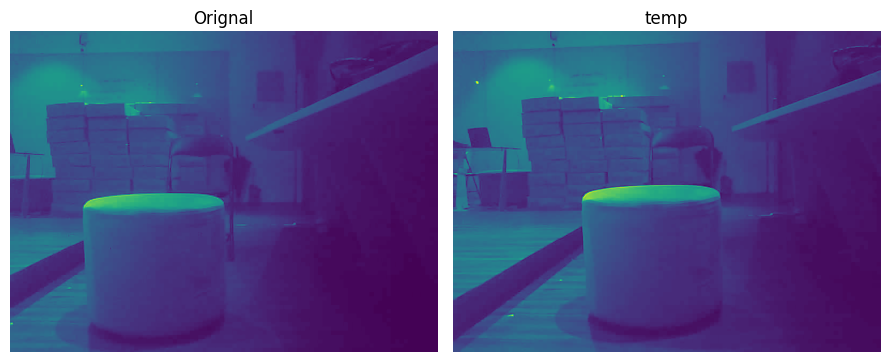

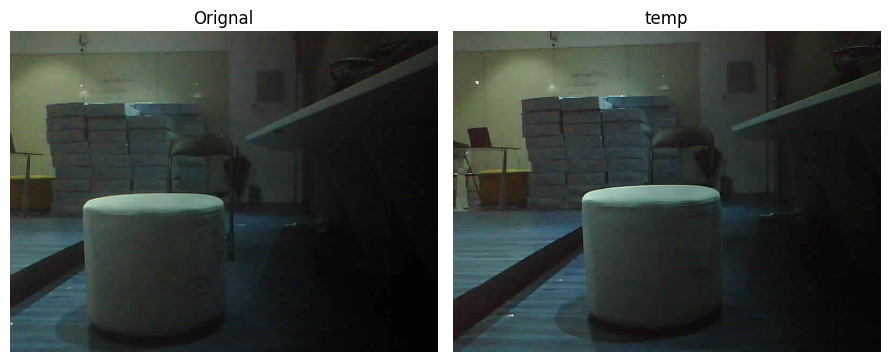

In [108]:
l_img_name = './updated/L_112.png'
r_img_name = './updated/R_112.png'

left_img = cv.imread(l_img_name, cv.IMREAD_GRAYSCALE)
right_img = cv.imread(r_img_name, cv.IMREAD_GRAYSCALE)
viewImages(left_img, right_img, "temp")

left_color_img = cv.imread(l_img_name, cv.IMREAD_COLOR)
right_color_img = cv.imread(r_img_name, cv.IMREAD_COLOR)
viewImages(left_color_img, right_color_img, "temp")

# Getting images using ESP Cameras

In [ ]:
left_url = 'http://192.168.205.216/cam-hi.jpg'
right_url = 'http://192.168.205.172/cam-hi.jpg'

left_img_resp=urllib.request.urlopen(left_url)
right_img_resp=urllib.request.urlopen(right_url)

left_imgnp=np.array(bytearray(left_img_resp.read()),dtype=np.uint8)
right_imgnp=np.array(bytearray(right_img_resp.read()),dtype=np.uint8)

left_color_img = cv.imdecode(left_imgnp,-1)
right_color_img = cv.imdecode(right_imgnp,-1)

left_img = cv.cvtColor(left_color_img, cv.COLOR_BGR2GRAY)
right_img = cv.cvtColor(right_color_img, cv.COLOR_BGR2GRAY)

# Getting images using USB cameras

In [ ]:
cap_left = cv.VideoCapture(0)
cap_right=cv.VideoCapture(1)

rect_left, left_img = cap_left.read()
rect_right, right_img = cap_right.read()

# Stereo Processing Algorithms

In [32]:
# Use SAD Algorithm for calculate disparities ---------------------------------------------------------------
@jit(nopython=True)
def compute_disparity_SAD(left_img, right_img, block_size, disparities):
    h, w = left_img.shape
    disparity = np.zeros((h, w), np.uint8)
    half_block = block_size // 2

    for y in range(half_block, h - half_block):
        for x in range(half_block, w - half_block):
            left_block = left_img[y - half_block:y + half_block + 1,
                                       x - half_block:x + half_block + 1]

            min_sad = block_size ** 2 * 255
            best_disparity = 0

            for d in range(disparities):
                x_right = x - d

                if x_right - half_block >= 0:
                    right_block = right_img[y - half_block:y + half_block + 1,
                                                 x_right - half_block:x_right + half_block + 1]

                    sad = np.sum(np.abs(left_block.astype(np.int32) - right_block.astype(np.int32)))

                    if sad < min_sad:
                        min_sad = sad
                        best_disparity = d

            disparity[y, x] = best_disparity

    return disparity

# Use SSD Algorithm for calculate disparities ---------------------------------------------------------------
@jit(nopython=True)
def compute_disparity_SSD(left_img, right_img, block_size, max_disparity):
    h, w = left_img.shape

    disparity = np.zeros((h, w), np.uint8)

    half_block = block_size // 2

    for y in range(half_block, h - half_block):
        for x in range(half_block, w - half_block):
            left_block = left_img[y - half_block:y + half_block + 1,
                                       x - half_block:x + half_block + 1]

            min_ssd = block_size ** 2 * 255
            best_disparity = 0

            for d in range(max_disparity):
                x_right = x - d

                if x_right - half_block >= 0:
                    right_block = right_img[y - half_block:y + half_block + 1,
                                                 x_right - half_block:x_right + half_block + 1]

                    ssd = np.sum((left_block.astype(np.int32) - right_block.astype(np.int32)) ** 2)

                    if ssd < min_ssd:
                        min_ssd = ssd
                        best_disparity = d
            disparity[y, x] = best_disparity

    return disparity

# Use NCC Algorithm for calculate disparities ---------------------------------------------------------------
@jit(nopython=True)
def compute_disparity_NCC(left_img, right_img, block_size, max_disparity):

    h, w = left_img.shape

    disparity_map = np.zeros((h, w), np.float32)

    half_block = block_size // 2

    for y in range(half_block, h - half_block):
        for x in range(half_block, w - half_block):
            left_block = left_img[y - half_block:y + half_block + 1, x - half_block:x + half_block + 1]

            left_mean = np.mean(left_block)

            best_ncc = -1
            best_disparity = 0

            for d in range(max_disparity):
                x_right = x - d

                if x_right - half_block >= 0:
                    right_block = right_img[y - half_block:y + half_block + 1, x_right - half_block:x_right + half_block + 1]

                    right_mean = np.mean(right_block)

                    numerator = np.sum((left_block - left_mean) * (right_block - right_mean))
                    left_norm = np.sum((left_block - left_mean) ** 2)
                    right_norm = np.sum((right_block - right_mean) ** 2)
                    denominator = np.sqrt(left_norm * right_norm)

                    if denominator > 0:
                        ncc_score = numerator / denominator

                        if ncc_score > best_ncc:
                            best_ncc = ncc_score
                            best_disparity = d

            disparity_map[y, x] = best_disparity

    return disparity_map

# YOLO object detection

In [78]:
def segmentation_disparity(img, disparity_map):
    results = model(img)    
    masks = results[0].masks.data    
    img_with_squares = img.copy()
    disparity_h, disparity_w = disparity_map.shape
    count = 0
    for i, mask in enumerate(masks):
        count += 1
        mask_np = mask.cpu().numpy()        
        mask_binary = (mask_np > 0.5).astype(np.uint8)        
        mask_binary_resized = cv.resize(mask_binary, (disparity_w, disparity_h), interpolation=cv.INTER_NEAREST)        
        masked_disparity = disparity_map * mask_binary_resized        
        non_zero_disparity_values = masked_disparity[mask_binary_resized == 1]
        
        if len(non_zero_disparity_values) > 0:
            plt.imshow(masked_disparity, cmap='jet')
            plt.savefig(f'./maps/disparity{count}.png', dpi=300)
            avg_disparity = np.mean(non_zero_disparity_values)
        else:
            avg_disparity = 0
        x, y, w, h = cv.boundingRect(mask_binary_resized)
        
        color = (0, 255, 0)
        cv.rectangle(img_with_squares, (x, y), (x+w, y+h), color, 2)
        cv.putText(img_with_squares, f"Avg Disparity: {avg_disparity:.2f}", 
                   (x, y - 10), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    return img_with_squares

def disparity_to_depth(avg_disparity, focal_length, baseline):
    if avg_disparity == 0:
        return 0
    depth = (focal_length * baseline) / avg_disparity
    return depth

def segmentation_depth(img, disparity_map):    
    results = model(img)
    masks = results[0].masks.data
    img_with_squares = img.copy()
    disparity_h, disparity_w = disparity_map.shape
    
    count = 0
    for i, mask in enumerate(masks):
        count += 1
        mask_np = mask.cpu().numpy()
        
        mask_binary = (mask_np > 0.5).astype(np.uint8)
        
        mask_binary_resized = cv.resize(mask_binary, (disparity_w, disparity_h), interpolation=cv.INTER_NEAREST)
        
        masked_disparity = disparity_map * mask_binary_resized
        
        non_zero_disparity_values = masked_disparity[mask_binary_resized == 1]
        
        if len(non_zero_disparity_values) > 0:
            avg_disparity = np.mean(non_zero_disparity_values)
        else:
            avg_disparity = 0

        avg_depth = disparity_to_depth(avg_disparity, focal_length, baseline)

        x, y, w, h = cv.boundingRect(mask_binary_resized)
        
        color = (0, 255, 0)
        cv.rectangle(img_with_squares, (x, y), (x+w, y+h), color, 2)
        cv.putText(img_with_squares, f"Avg Depth: {avg_depth:.2f}m", 
                   (x, y - 10), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    
    return img_with_squares

# Depth Estimation Using Different Algorithms

In [ ]:
# Changing block size SAD
fig, axs = plt.subplots(2, 5, figsize=(75,75))

for i in range(5):
    disparity = compute_disparity_SAD(left_img, right_img, 2 * i + 3, 32)
    img_disparity = segmentation_disparity(left_color_img, disparity)

    img_depth = segmentation_depth(left_color_img, disparity)

    axs[0, i % 5].imshow(img_disparity)
    axs[0, i % 5].axis('off')
    axs[0, i % 5].set_title(f"D : {i}")

    axs[1, i % 5].imshow(img_depth)
    axs[1, i % 5].axis('off')
    axs[1, i % 5].set_title(f"D : {i}")

plt.tight_layout()
plt.savefig('./updated_maps/SAD_B(v)_BL(7).png', dpi=300)
plt.show()
 



0: 480x640 1 chair, 1 laptop, 23.1ms
Speed: 1.0ms preprocess, 23.1ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 285.5ms
Speed: 4.0ms preprocess, 285.5ms inference, 5.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 154.6ms
Speed: 3.0ms preprocess, 154.6ms inference, 6.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 271.8ms
Speed: 7.0ms preprocess, 271.8ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 238.4ms
Speed: 4.0ms preprocess, 238.4ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 277.7ms
Speed: 3.0ms preprocess, 277.7ms inference, 5.0ms postprocess per image at shape (1, 3, 480, 640)



0: 480x640 1 chair, 1 laptop, 225.0ms
Speed: 3.1ms preprocess, 225.0ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 173.6ms
Speed: 6.1ms preprocess, 173.6ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 188.9ms
Speed: 3.0ms preprocess, 188.9ms inference, 4.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 282.1ms
Speed: 4.0ms preprocess, 282.1ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 180.2ms
Speed: 3.0ms preprocess, 180.2ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 164.3ms
Speed: 3.0ms preprocess, 164.3ms inference, 4.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 188.8ms
Speed: 3.0ms preprocess, 188.8ms inference, 8.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 28.9ms
Spe

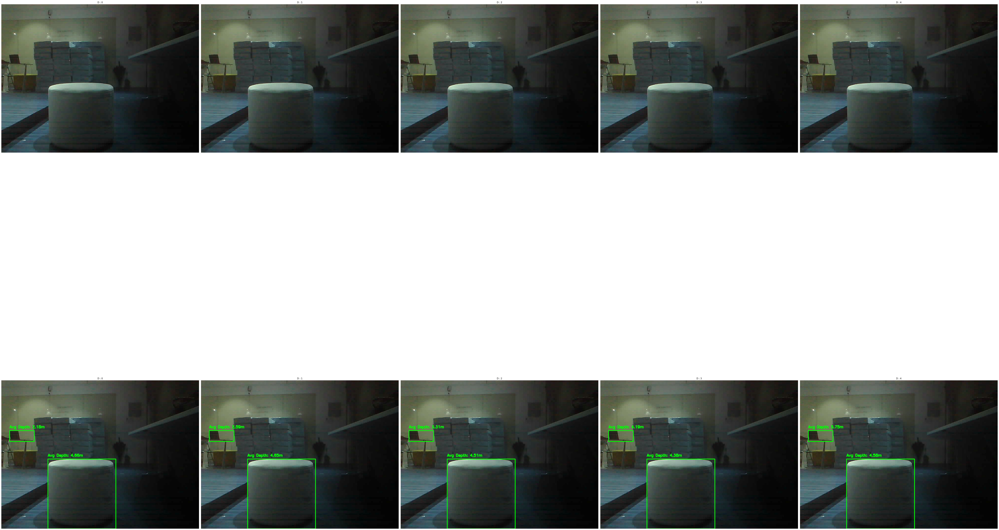

In [ ]:
# Changing block size SSD
fig, axs = plt.subplots(2, 5, figsize=(75,75))

for i in range(5):
    disparity = compute_disparity_SSD(left_img, right_img, 2 * i + 3, 32)
    img_disparity = segmentation_disparity(left_color_img, disparity)

    img_depth = segmentation_depth(left_color_img, disparity)

    axs[0, i % 5].imshow(img_disparity)
    axs[0, i % 5].axis('off')
    axs[0, i % 5].set_title(f"D : {i}")

    axs[1, i % 5].imshow(img_depth)
    axs[1, i % 5].axis('off')
    axs[1, i % 5].set_title(f"D : {i}")

plt.tight_layout()
plt.savefig('./updated_maps/SSD_B(v)_BL(7).png', dpi=300)
plt.show()
 



0: 480x640 1 chair, 1 laptop, 171.0ms
Speed: 8.3ms preprocess, 171.0ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 218.8ms
Speed: 4.0ms preprocess, 218.8ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 193.1ms
Speed: 4.1ms preprocess, 193.1ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 313.8ms
Speed: 2.8ms preprocess, 313.8ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 308.0ms
Speed: 3.0ms preprocess, 308.0ms inference, 5.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 245.6ms
Speed: 5.1ms preprocess, 245.6ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 314.7ms
Speed: 6.0ms preprocess, 314.7ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 185.9ms
Sp

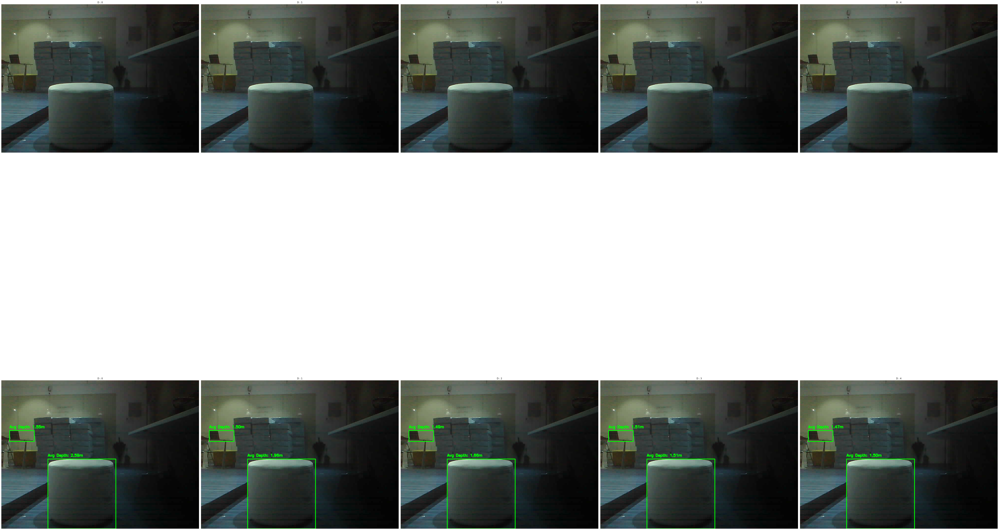

In [ ]:
# Changing block size NCC
fig, axs = plt.subplots(2, 5, figsize=(75,75))

for i in range(5):
    disparity = compute_disparity_NCC(left_img, right_img, 2 * i + 3, 32)
    img_disparity = segmentation_disparity(left_color_img, disparity)

    img_depth = segmentation_depth(left_color_img, disparity)

    axs[0, i % 5].imshow(img_disparity)
    axs[0, i % 5].axis('off')
    axs[0, i % 5].set_title(f"D : {i}")

    axs[1, i % 5].imshow(img_depth)
    axs[1, i % 5].axis('off')
    axs[1, i % 5].set_title(f"D : {i}")

plt.tight_layout()
plt.savefig('./updated_maps/NCC_B(v)_BL(7).png', dpi=300)
plt.show()
 



0: 480x640 1 chair, 1 laptop, 187.2ms
Speed: 4.6ms preprocess, 187.2ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 243.5ms
Speed: 3.1ms preprocess, 243.5ms inference, 4.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 21.2ms
Speed: 2.0ms preprocess, 21.2ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 288.4ms
Speed: 3.0ms preprocess, 288.4ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 21.2ms
Speed: 2.0ms preprocess, 21.2ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 267.4ms
Speed: 3.0ms preprocess, 267.4ms inference, 4.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 108.1ms
Speed: 3.0ms preprocess, 108.1ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 254.1ms
Speed:

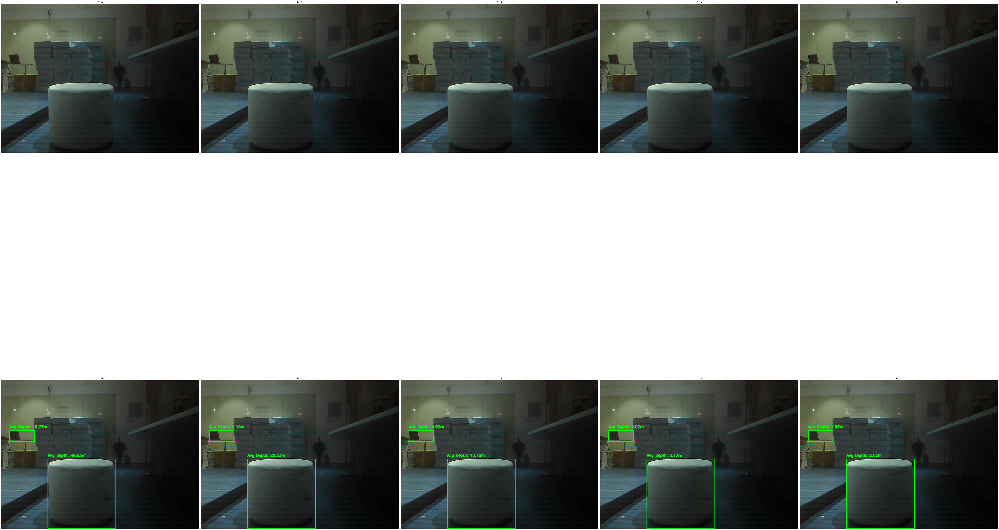

In [ ]:
# Changing disparities SAD
fig, axs = plt.subplots(2, 5, figsize=(75,75))

for i in range(5):
    disparity = compute_disparity_SAD(left_img, right_img, 5, 2 ** (i + 1) + 1)
    img_disparity = segmentation_disparity(left_color_img, disparity)

    img_depth = segmentation_depth(left_color_img, disparity)

    axs[0, i % 5].imshow(img_disparity)
    axs[0, i % 5].axis('off')
    axs[0, i % 5].set_title(f"D : {i}")

    axs[1, i % 5].imshow(img_depth)
    axs[1, i % 5].axis('off')
    axs[1, i % 5].set_title(f"D : {i}")

plt.tight_layout()
plt.savefig('./updated_maps/SAD_DP(v)_BL(7).png', dpi=300)
plt.show()
 



0: 480x640 1 chair, 1 laptop, 229.8ms
Speed: 6.7ms preprocess, 229.8ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 139.3ms
Speed: 3.0ms preprocess, 139.3ms inference, 3.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 22.1ms
Speed: 2.0ms preprocess, 22.1ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 348.1ms
Speed: 3.1ms preprocess, 348.1ms inference, 3.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 27.1ms
Speed: 2.1ms preprocess, 27.1ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 268.6ms
Speed: 3.1ms preprocess, 268.6ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 307.1ms
Speed: 3.1ms preprocess, 307.1ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 22.2ms
Speed: 

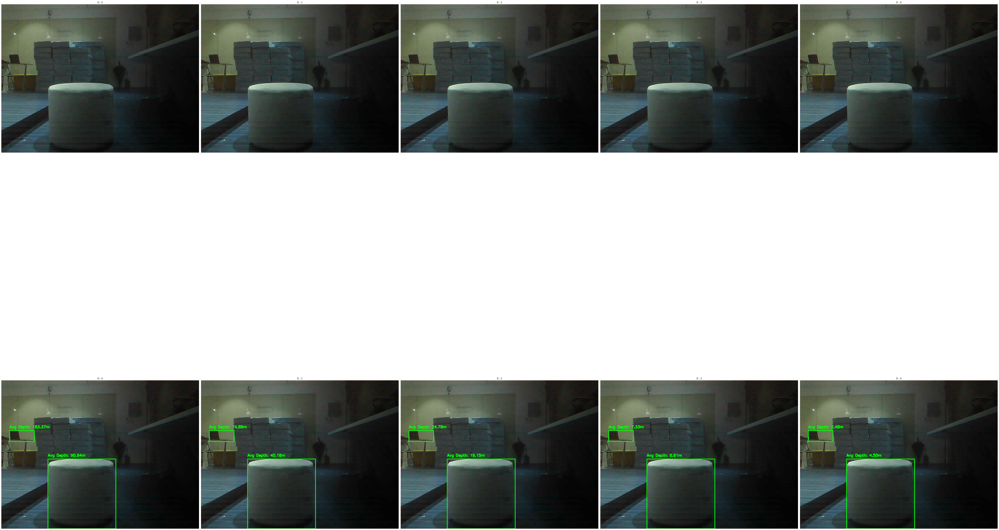

In [ ]:
# Changing disparities SSD
fig, axs = plt.subplots(2, 5, figsize=(75,75))

for i in range(5):
    disparity = compute_disparity_SSD(left_img, right_img, 5, 2 ** (i + 1) + 1)
    img_disparity = segmentation_disparity(left_color_img, disparity)

    img_depth = segmentation_depth(left_color_img, disparity)

    axs[0, i % 5].imshow(img_disparity)
    axs[0, i % 5].axis('off')
    axs[0, i % 5].set_title(f"D : {i}")

    axs[1, i % 5].imshow(img_depth)
    axs[1, i % 5].axis('off')
    axs[1, i % 5].set_title(f"D : {i}")

plt.tight_layout()
plt.savefig('./updated_maps/SSD_DP(v)_BL(7).png', dpi=300)
plt.show()
 



0: 480x640 1 chair, 1 laptop, 286.7ms
Speed: 4.0ms preprocess, 286.7ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 172.2ms
Speed: 0.0ms preprocess, 172.2ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 22.1ms
Speed: 2.0ms preprocess, 22.1ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 329.6ms
Speed: 2.9ms preprocess, 329.6ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 29.0ms
Speed: 1.0ms preprocess, 29.0ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 195.6ms
Speed: 3.0ms preprocess, 195.6ms inference, 4.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 213.1ms
Speed: 2.0ms preprocess, 213.1ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 183.5ms
Speed:

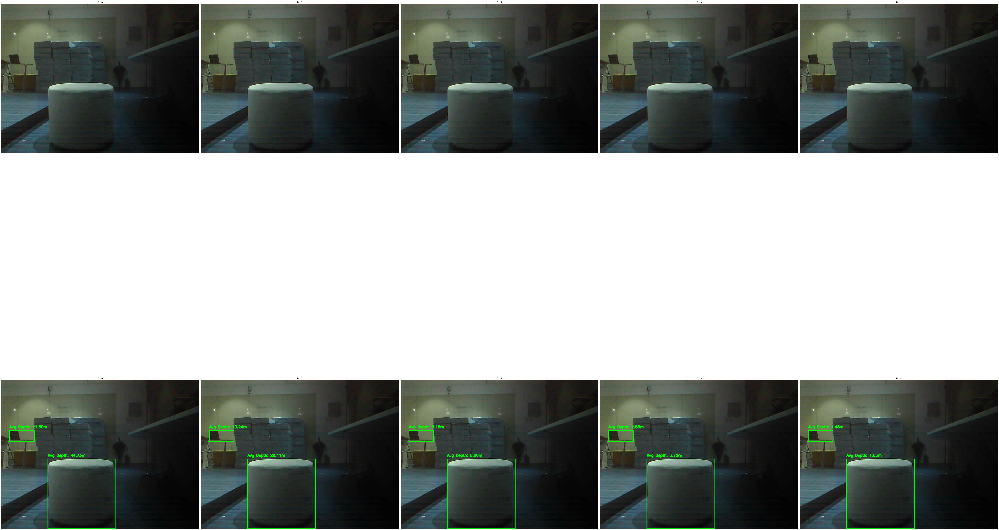

In [ ]:
# Changing disparities SAD
fig, axs = plt.subplots(2, 5, figsize=(75,75))

for i in range(5):
    disparity = compute_disparity_NCC(left_img, right_img, 5, 2 ** (i + 1) + 1)
    img_disparity = segmentation_disparity(left_color_img, disparity)

    img_depth = segmentation_depth(left_color_img, disparity)

    axs[0, i % 5].imshow(img_disparity)
    axs[0, i % 5].axis('off')
    axs[0, i % 5].set_title(f"D : {i}")

    axs[1, i % 5].imshow(img_depth)
    axs[1, i % 5].axis('off')
    axs[1, i % 5].set_title(f"D : {i}")

plt.tight_layout()
plt.savefig('./updated_maps/NCC_DP(v)_BL(7).png', dpi=300)
plt.show()
 



0: 480x640 1 chair, 1 laptop, 242.2ms
Speed: 3.0ms preprocess, 242.2ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 21.9ms
Speed: 2.0ms preprocess, 21.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 22.7ms
Speed: 2.0ms preprocess, 22.7ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 280.5ms
Speed: 5.0ms preprocess, 280.5ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 24.0ms
Speed: 1.0ms preprocess, 24.0ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 169.4ms
Speed: 3.1ms preprocess, 169.4ms inference, 5.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 21.2ms
Speed: 2.0ms preprocess, 21.2ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 182.7ms
Speed: 3.1

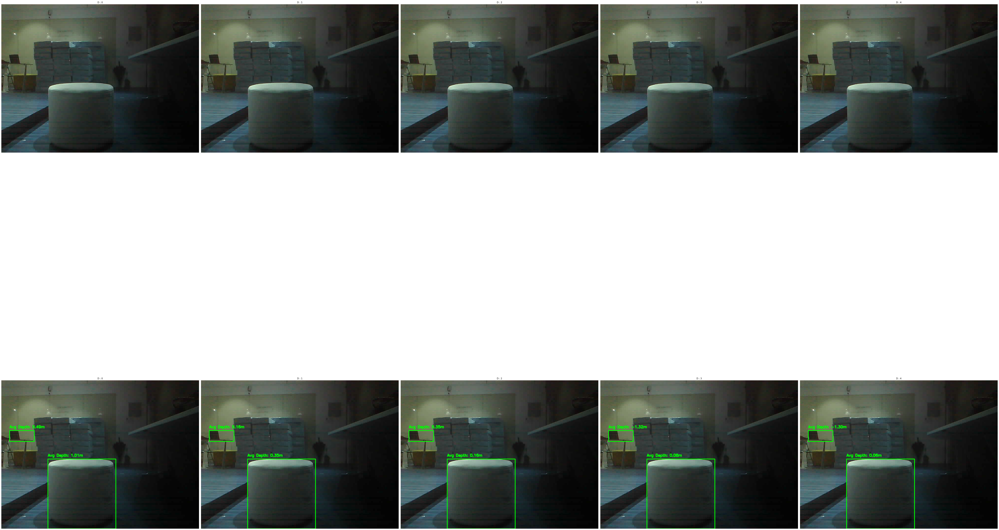

In [ ]:
fig, axs = plt.subplots(2, 5, figsize=(75,75))

for i in range(5):
    stereo = cv.StereoBM_create(numDisparities=2**(4+i), blockSize=5)
    disparity = stereo.compute(left_img, right_img)

    img_disparity = segmentation_disparity(left_color_img, disparity)

    img_depth = segmentation_depth(left_color_img, disparity)

    axs[0, i % 5].imshow(img_disparity)
    axs[0, i % 5].axis('off')
    axs[0, i % 5].set_title(f"D : {i}")

    axs[1, i % 5].imshow(img_depth)
    axs[1, i % 5].axis('off')
    axs[1, i % 5].set_title(f"D : {i}")

plt.tight_layout()
plt.savefig('./updated_maps/CV_SB_DP(v)_BL(7).png', dpi=300)
plt.show()


0: 480x640 1 chair, 1 laptop, 285.7ms
Speed: 4.1ms preprocess, 285.7ms inference, 5.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 215.6ms
Speed: 3.0ms preprocess, 215.6ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 22.2ms
Speed: 1.0ms preprocess, 22.2ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 281.3ms
Speed: 3.0ms preprocess, 281.3ms inference, 5.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 22.3ms
Speed: 2.0ms preprocess, 22.3ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 288.4ms
Speed: 4.0ms preprocess, 288.4ms inference, 4.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 22.1ms
Speed: 2.0ms preprocess, 22.1ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chair, 1 laptop, 270.1ms
Speed: 5

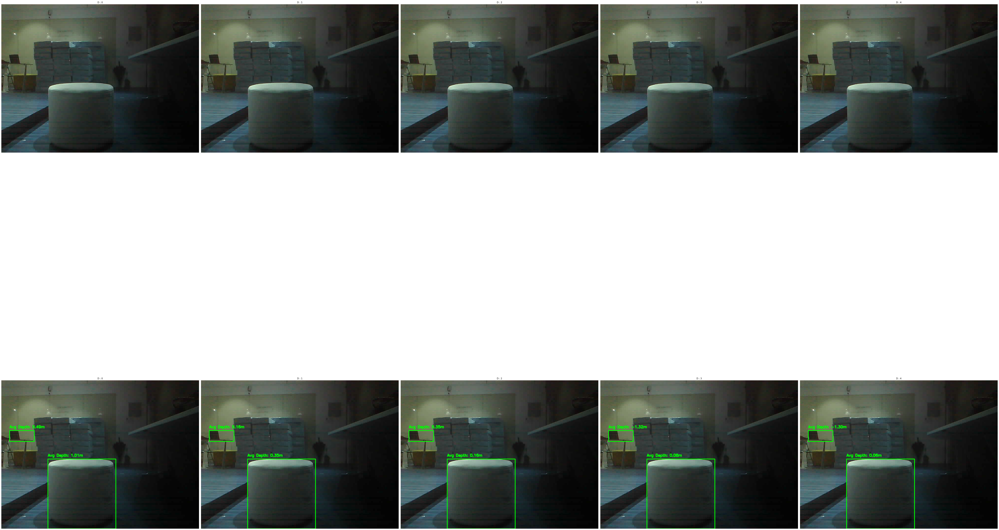

In [ ]:
fig, axs = plt.subplots(2, 5, figsize=(75,75))

for i in range(5):
    stereo = cv.StereoBM_create(numDisparities=2**(4+i), blockSize=5)
    disparity = stereo.compute(left_img, right_img)

    img_disparity = segmentation_disparity(left_color_img, disparity)

    img_depth = segmentation_depth(left_color_img, disparity)

    axs[0, i % 5].imshow(img_disparity)
    axs[0, i % 5].axis('off')
    axs[0, i % 5].set_title(f"D : {i}")

    axs[1, i % 5].imshow(img_depth)
    axs[1, i % 5].axis('off')
    axs[1, i % 5].set_title(f"D : {i}")

plt.tight_layout()
plt.savefig('./updated_maps/CV_SB_B(v)_BL(7).png', dpi=300)
plt.show()

# K - Means for Disparities

In [79]:
def disparity_to_depth(avg_disparity, focal_length, baseline):
    if avg_disparity == 0:
        return 0
    depth = (focal_length * baseline) / avg_disparity
    return depth

def select_farthest_from_mode(disparity_values, mode, k=15):
    disparity_values = disparity_values.reshape(-1, 1)
    
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(disparity_values)
    
    cluster_centers = kmeans.cluster_centers_
    
    cluster_differences = np.abs(cluster_centers - mode)
    
    sorted_indices = np.argsort(cluster_differences.flatten())[::-1]
    
    farthest_values = cluster_centers[sorted_indices].flatten()
    
    return farthest_values

def segmentation_disparity_k(img, disparity_map, k=15):
    results = model(img)
    masks = results[0].masks.data
    img_with_squares = img.copy()
    disparity_h, disparity_w = disparity_map.shape
    count = 0

    for i, mask in enumerate(masks):
        count += 1
        mask_np = mask.cpu().numpy()
        mask_binary = (mask_np > 0.5).astype(np.uint8)

        mask_binary_resized = cv.resize(mask_binary, (disparity_w, disparity_h), interpolation=cv.INTER_NEAREST) 
        
        masked_disparity = disparity_map * mask_binary_resized
        non_zero_disparity_values = masked_disparity[mask_binary_resized == 1]
        
        if len(non_zero_disparity_values) > 0:
            mode_disparity_result = stats.mode(non_zero_disparity_values, axis=None)
            if isinstance(mode_disparity_result.mode, np.ndarray) and len(mode_disparity_result.mode) > 0:
                mode_disparity = mode_disparity_result.mode[0]
            else:
                mode_disparity = np.mean(non_zero_disparity_values)

            farthest_values = select_farthest_from_mode(non_zero_disparity_values, mode_disparity, k)

            for disparity_value in farthest_values:
                img_with_squares[mask_binary_resized == 1] = disparity_value
            
            plt.imshow(masked_disparity, cmap='jet')
            plt.savefig(f'./maps/disparity{count}.png', dpi=300)
        
        x, y, w, h = cv.boundingRect(mask_binary_resized)
        
        color = (0, 255, 0)
        cv.rectangle(img_with_squares, (x, y), (x+w, y+h), color, 2)
        cv.putText(img_with_squares, f"Disparity Mode: {mode_disparity:.2f}", 
                   (x, y - 10), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    return img_with_squares

def segmentation_depth_k(img, disparity_map, k=10):
    results = model(img)
    masks = results[0].masks.data
    img_with_squares = img.copy()
    disparity_h, disparity_w = disparity_map.shape
    count = 0

    color = (0, 255, 0)

    for i, mask in enumerate(masks):
        count += 1
        mask_np = mask.cpu().numpy()
        mask_binary = (mask_np > 0.5).astype(np.uint8)
        
        mask_binary_resized = cv.resize(mask_binary, (disparity_w, disparity_h), interpolation=cv.INTER_NEAREST)
        
        masked_disparity = disparity_map * mask_binary_resized
        non_zero_disparity_values = masked_disparity[mask_binary_resized == 1]
        
        if len(non_zero_disparity_values) > 0:
            mode_disparity_result = stats.mode(non_zero_disparity_values, axis=None)
            if isinstance(mode_disparity_result.mode, np.ndarray) and len(mode_disparity_result.mode) > 0:
                mode_disparity = mode_disparity_result.mode[0]
            else:
                mode_disparity = np.mean(non_zero_disparity_values)

            farthest_values = select_farthest_from_mode(non_zero_disparity_values, mode_disparity, k)
            
            for disparity_value in farthest_values:
                img_with_squares[mask_binary_resized == 1] = disparity_value
            
            plt.imshow(masked_disparity, cmap='jet')
            plt.savefig(f'./maps/disparity_depth_{count}.png', dpi=300)
        
        avg_disparity = np.mean(non_zero_disparity_values) if len(non_zero_disparity_values) > 0 else 0
        avg_depth = disparity_to_depth(avg_disparity, focal_length, baseline)

        x, y, w, h = cv.boundingRect(mask_binary_resized)
        cv.rectangle(img_with_squares, (x, y), (x + w, y + h), color, 2)
        
        cv.putText(img_with_squares, f"Avg Depth: {avg_depth:.2f}m", 
                   (x, y - 10), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    return img_with_squares

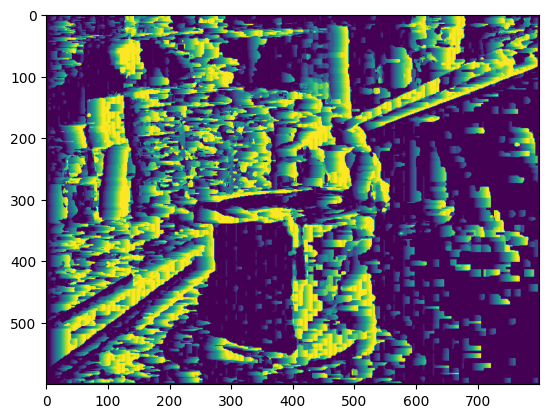

In [101]:
disparity = compute_disparity_SAD(left_img, right_img, 5, 32)
plt.imshow(disparity)

In [109]:
temp = segmentation_disparity_k(left_color_img, disparity)
plt.imshow(temp)


0: 480x640 (no detections), 185.3ms
Speed: 12.9ms preprocess, 185.3ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)


AttributeError: 'NoneType' object has no attribute 'data'


0: 480x640 1 person, 2 chairs, 291.6ms
Speed: 2.9ms preprocess, 291.6ms inference, 9.0ms postprocess per image at shape (1, 3, 480, 640)


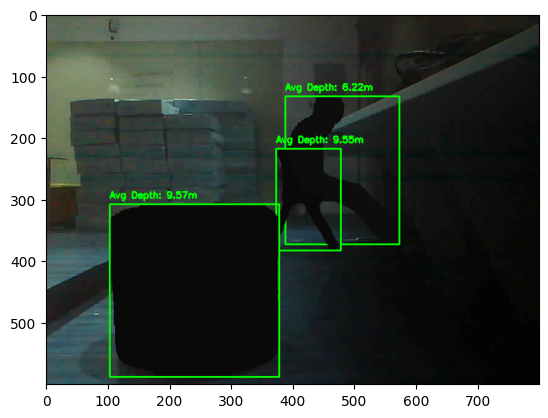

In [98]:
temp = segmentation_depth_k(left_color_img, disparity)

plt.imshow(temp)